In [1]:
using DelimitedFiles
using Plots
using Optim

In [2]:
# đọc dữ liệu
A= readdlm("Admins.txt",',')

100×3 Array{Float64,2}:
 34.6237  78.0247  0.0
 30.2867  43.895   0.0
 35.8474  72.9022  0.0
 60.1826  86.3086  1.0
 79.0327  75.3444  1.0
 45.0833  56.3164  0.0
 61.1067  96.5114  1.0
 75.0247  46.554   1.0
 76.0988  87.4206  1.0
 84.4328  43.5334  1.0
 95.8616  38.2253  0.0
 75.0137  30.6033  0.0
 82.3071  76.482   1.0
  ⋮                
 78.6354  96.6474  1.0
 52.348   60.7695  0.0
 94.0943  77.1591  1.0
 90.4486  87.5088  1.0
 55.4822  35.5707  0.0
 74.4927  84.8451  1.0
 89.8458  45.3583  1.0
 83.4892  48.3803  1.0
 42.2617  87.1039  1.0
 99.315   68.7754  1.0
 55.34    64.9319  1.0
 74.7759  89.5298  1.0

In [3]:
y=Int.(A[:,3])
X= [ones(length(y)) A[:,1:2]]

100×3 Array{Float64,2}:
 1.0  34.6237  78.0247
 1.0  30.2867  43.895
 1.0  35.8474  72.9022
 1.0  60.1826  86.3086
 1.0  79.0327  75.3444
 1.0  45.0833  56.3164
 1.0  61.1067  96.5114
 1.0  75.0247  46.554
 1.0  76.0988  87.4206
 1.0  84.4328  43.5334
 1.0  95.8616  38.2253
 1.0  75.0137  30.6033
 1.0  82.3071  76.482
 ⋮             
 1.0  78.6354  96.6474
 1.0  52.348   60.7695
 1.0  94.0943  77.1591
 1.0  90.4486  87.5088
 1.0  55.4822  35.5707
 1.0  74.4927  84.8451
 1.0  89.8458  45.3583
 1.0  83.4892  48.3803
 1.0  42.2617  87.1039
 1.0  99.315   68.7754
 1.0  55.34    64.9319
 1.0  74.7759  89.5298

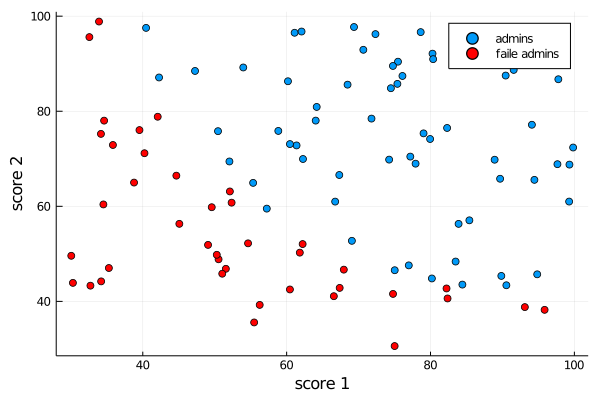

In [4]:
positive=(y.==1)
negative=(y.==0)
plot(X[positive,2],X[positive,3], st=:scatter, xlabel="score 1", ylabel="score 2",label="admins")
plot!(X[negative,2], X[negative,3], st=:scatter , color="red", label="faile admins")

In [14]:
# xây dựng hàm sigmoid
function sigmoid(X, θ)
    g = 1 ./(1 .+ exp.(-(X*θ)))
    return g
end

sigmoid (generic function with 1 method)

In [15]:
# xây dựng hàm loss function
function loss(X,y,θ)
    N= length(y)
    g=sigmoid(X,θ)
    l= y'*log.(g) + (1 .- y)'*log.(1 .- g)
    J= -l/N
    J
end

loss (generic function with 1 method)

In [16]:
# xây dựng hàm tính gradient
function gradient(X, y,θ)
    ∇= (X'*(sigmoid(X,θ) - y))/length(y)
    return ∇
end

gradient (generic function with 1 method)

In [17]:
θ=[0;0;0]
∇= gradient(X,y,θ)

3-element Array{Float64,1}:
  -0.1
 -12.009216589291151
 -11.262842205513593

In [1]:
# xây dụng hàm training
function train(X,y,α=0.001, T=1000)
    N,D= size(X)
    θs=zeros(D, T)
    for i=1:T-1
        ∇= gradient(X,y,θs[:,i])
        θs[:,i+1]= θs[:,i] - α*∇
    end
    return θs
end

train (generic function with 3 methods)

In [19]:
N,D= size(X)
θ_0=zeros(D)
θs=train(X,y)

3×1000 Array{Float64,2}:
 0.0  0.0001     -0.000118209  -7.35348e-5  …  -0.0693225    -0.0693917
 0.0  0.0120092   0.00247583    0.010626        0.0109064     0.0109068
 0.0  0.0112628   0.000905224   0.00843307      0.000990278   0.000990816

In [20]:
ts=collect(1:1000)
Js=map(t -> loss(X,y,θs[:,t]),ts)


1000-element Array{Float64,1}:
 0.693147180559945
 0.6982906893667754
 0.6597117632164303
 0.6616272696122697
 0.6488615344619069
 0.6496960933384355
 0.6431098658230963
 0.643465208403156
 0.6395252291304567
 0.6396433985595571
 0.6370958143658065
 0.6370920319486808
 0.6353639411864052
 ⋮
 0.6250432844830052
 0.6250384902305158
 0.6250336960607181
 0.6250289019736108
 0.6250241079691928
 0.6250193140474621
 0.6250145202084177
 0.625009726452058
 0.6250049327783819
 0.6250001391873877
 0.6249953456790742
 0.6249905522534397

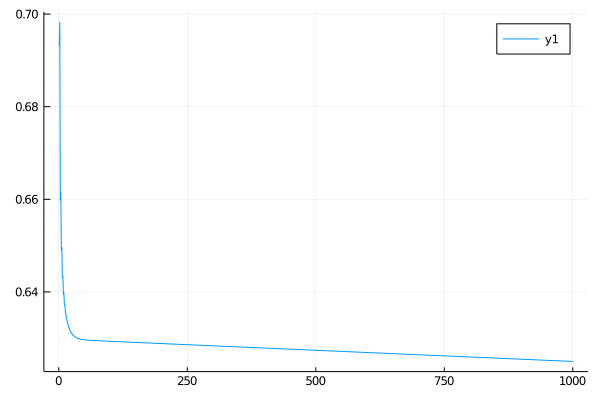

In [21]:
# đồ thị hội tụ của mo hình
plot(ts, Js)

In [ ]:
# xây dựng hàm predict
function predict(Xnew,θ)
    
end

In [22]:
# Try to optimize the Rosenblock funtion
f(x1,x2)= (1-x1)^2 + 100*(x2-x1^2)^2

f (generic function with 1 method)

In [23]:
f(x)= (1-x[1])^2 + 100*(x[2]-x[1]^2)^2

f (generic function with 2 methods)

In [24]:
x_1= -5:0.02:5
x_2= -5:0.02:5
length(collect(x_1))

501

In [25]:
plotly()

┌ Info: For saving to png with the Plotly backend ORCA has to be installed.
└ @ Plots C:\Users\LENOVO\.julia\packages\Plots\4EfKl\src\backends.jl:373


Plots.PlotlyBackend()

In [26]:
plot(x_1,x_2,f,st=:surface)

<!DOCTYPE html>
 
 
 Plots.jl

In [33]:
θ_0=[0. 0.]

1×2 Array{Float64,2}:
 0.0  0.0

In [45]:
result= optimize(f,θ_0)

 * Status: success

 * Candidate solution
    Final objective value:     3.525527e-09

 * Found with
    Algorithm:     Nelder-Mead

 * Convergence measures
    √(Σ(yᵢ-ȳ)²)/n ≤ 1.0e-08

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    60
    f(x) calls:    118


In [46]:
θ_best= Optim.minimizer(result)

1×2 Array{Float64,2}:
 0.999963  0.999932

In [42]:
#f(x)= (1-x[1])^2 + 100*(x[2]-x[1]^2)^2
function g!(∇,x)
    ∇[1]=-2*(1-x[1]) - 400*(x[2]-x[1])*x[1]
    ∇[2]=200*(x[2]-x[1]^2) 
end

g! (generic function with 1 method)

In [29]:
t=optimize(f,g!,θ_0) #use the quasi-newton optimize alg: L-BFGS thuat toan tua newton

LoadError: UndefVarError: f not defined

In [27]:
# sử dụng thư viện Optim sử dụng phương pháp giả new-ton để giải bài trên
# xây dựng hàm loss function dùng trong thư vieenh Optim
function loss(θ)
    N= length(y)
    g=sigmoid(X,θ)
    l= y'*log.(g) + (1 .- y)'*log.(1 .- g)
    J= -l/N
    J
end

loss (generic function with 2 methods)

In [28]:
# sử dụng Optim dùng thuật toán Nelder-Mead
reslut= optimize(loss, θ_0)
θ_best= Optim.minimizer(reslut)

3-element Array{Float64,1}:
 -25.162619257493436
   0.2062426158179525
   0.20147741047915213

In [25]:
# code lại gradient để dùng thuật toán giả new-ton
# xây dựng hàm tính gradient
function gradient!(∇,θ)
    ∇=zeros(length(θ))
    for i = 1: length(θ)
        ∇= (X'*(sigmoid(X,θ) - y))/length(y)
    end
end

gradient! (generic function with 1 method)

In [30]:
# # sử dụng Optim dùng thuật toán giả new-ton
reslut1= optimize(gradient!, θ_0)

LoadError: MethodError: Cannot `convert` an object of type Array{Float64,1} to an object of type Float64
Closest candidates are:
  convert(::Type{T}, !Matched::ArrayInterface.StaticInt{N}) where {T<:Number, N} at C:\Users\LENOVO\.julia\packages\ArrayInterface\NbkVT\src\static.jl:18
  convert(::Type{T}, !Matched::T) where T<:Number at number.jl:6
  convert(::Type{T}, !Matched::Number) where T<:Number at number.jl:7
  ...

In [30]:
# vẽ đường phân loại bộ dữ liệu
w= ln.((1 ./sigmoid(X,θ_best)) .- 1)
plot(X[positive,2],X[positive,3], st=:scatter, xlabel="score 1", ylabel="score 2",label="admins")
plot!(X[negative,2], X[negative,3], st=:scatter , color="red", label="faile admins")
plot

LoadError: UndefVarError: ln not defined

In [31]:
w= ln.((1 ./sigmoid(X,θ_best)) .- 1)

LoadError: UndefVarError: ln not defined